# Cluster cells by secreted proteins (human protein atlas annotataion)

In [1]:
# load annotation and packages needed
from scSecretome.sc import *
from scSecretome.annot import *
import scanpy as sc

scanpy==1.4.2 anndata==0.6.22.post1 umap==0.3.10 numpy==1.17.2 scipy==1.3.1 pandas==0.25.1 scikit-learn==0.21.3 statsmodels==0.10.1 python-igraph==0.7.1 louvain==0.6.1 


In [2]:
help(read_HPA)

Help on function read_HPA in module scSecretome.annot:

read_HPA(tsv_file, return_all=False)
    extract gene symbols from human protein altas
    
    input: HPA tsv file at ~/human_protein_atlas
    output: list of gene symbols
    
    for example: 
    input: protein_class_Blood.tsv
    output: ~30 blood group antigen proteins's gene symbol



## read processed single cell data
two sets:
1. `concat_one` is CD34+ cells from Pellin et.al
2. `concat_two` is Lin- cells from Pellin et. al

In [3]:
# read processed, filtered, normalized single cell data.
concat_one = sc.read('~/processed_single_cell_data/pellin_cd34.h5ad')
concat_two = sc.read('~/processed_single_cell_data/pellin_lin.h5ad')

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


## read Human protein atlas annotation
two kinds: `secreted protein` and `membrane protein`

In [4]:
secreted_protein = read_HPA('protein_class_Predicted_membrane.tsv', return_all = True)
membrane_protein = read_HPA('protein_class_Predicted_secrete.tsv', return_all = True)

In [5]:
# take a look at what's inside
secreted_protein.head()

,Gene description,RNA cell line specificity,RNA blood lineage specificity score
Gene,,,
A3GALT2,"Alpha 1,3-galactosyltransferase 2",Group enriched,15.0
A4GALT,"Alpha 1,4-galactosyltransferase (P blood group)",Cell line enhanced,13.0
AACS,Acetoacetyl-CoA synthetase,Low cell line specificity,NaN
AADACL3,Arylacetamide deacetylase like 3,Cell line enriched,NaN
AADACL4,Arylacetamide deacetylase like 4,Cell line enhanced,NaN


## functions
`merge_subset` gives us variable secreted/membrane protein.

`vis_subset` helps us see the variable secreted/membrane protein by lineage inferred from **WHOLE** RNA.

` recluster` shows what will happed if we cluster cells by **only the variable SECRETED/MEMRBANE** protein.

In [6]:
def merge_subset(sc_data, HPA_subset):
    '''
    Find with secreted/membrane protein that is variable in single cell data set. print top 20
    input:
    - sc_data: anndata from scanpy
    - HPA_subset: read_HPA(return_all = True)
    
    return: merged dataframe, top 20 variable secreted-membrane genes
    '''
    # rank secreted protein by dispersion_norm
    secreted_merge = pd.merge(sc_data.var, HPA_subset, left_index = True, right_index = True).sort_values(by = 'dispersions_norm', ascending = False)
    top_twenty = secreted_merge.iloc[:20]
    print(top_twenty['Gene description'])
    
    return(top_twenty.index.tolist(), secreted_merge)
    # for each bin of mean expression, highly variable genes are selected.

In [7]:
def vis_subset(sc_data, top):
    
    # plotting on original clustering by ALL RNA species
    sc.pl.umap(sc_data, color = ['batch', 'louvain'] + top)
    
    sc.pl.heatmap(concat_one, var_names = top, groupby = 'batch')
    
    sc.pl.heatmap(concat_one, var_names = top, groupby = 'louvain')

In [8]:
import anndata
def recluster(sc_data, merged, z_score_cutoff):

    # select the secreted proteins with high z-score
    exp = sc_data[:, merged.loc[merged['dispersions_norm'] >= z_score_cutoff].index]
    # wipe out old annotations on genes
    secreted_exp = anndata.AnnData(exp.X, obs = exp.obs[['batch', 'louvain']])
    
    # calculate the plotting
    sc.tl.pca(secreted_exp, svd_solver='arpack')
    sc.pp.neighbors(secreted_exp)
    
    # UMAP
    sc.tl.umap(secreted_exp)
    sc.pl.umap(secreted_exp, color = ['batch', 'louvain']) # see if old structure is ruined
    
    # force directed
    sc.tl.draw_graph(secreted_exp)
    sc.pl.draw_graph(secreted_exp, color=['batch', 'louvain'])
    
    # PAGA
    sc.tl.paga(secreted_exp)
    sc.pl.paga(secreted_exp, color=['batch', 'louvain'])
    
    return(secreted_exp)

## First set
1. single cell = CD34
2. **secreted** protein

In [9]:
top, merged = merge_subset(concat_one, secreted_protein)

KLRB1                   Killer cell lectin like receptor B1
PSKH1                              Protein serine kinase H1
LPAR1                      Lysophosphatidic acid receptor 1
PANX1                                            Pannexin 1
FXYD2      FXYD domain containing ion transport regulator 2
TENM4                      Teneurin transmembrane protein 4
CMTM4     CKLF like MARVEL transmembrane domain containi...
FCER1A                       Fc fragment of IgE receptor Ia
MS4A2                        Membrane spanning 4-domains A2
CACNG6    Calcium voltage-gated channel auxiliary subuni...
FAT3                                FAT atypical cadherin 3
RYR1                                   Ryanodine receptor 1
MUC12                     Mucin 12, cell surface associated
TRIB2                               Tribbles pseudokinase 2
OR4K13    Olfactory receptor family 4 subfamily K member 13
KCNK6     Potassium two pore domain channel subfamily K ...
MS4A14                      Membrane spa

/home/hsher/miniconda3/lib/python3.7/site-packages/anndata/core/anndata.py:299: FutureWarning: In anndata v0.7+, arrays contained within an AnnData object will maintain their dimensionality. For example, prior to v0.7 `adata[0, 0].X` returned a scalar and `adata[0, :]` returned a 1d array, post v0.7 they will return two dimensional arrays. If you would like to get a one dimensional array from your AnnData object, consider using the `adata.obs_vector`, `adata.var_vector` methods or accessing the array directly.
  warn_flatten()


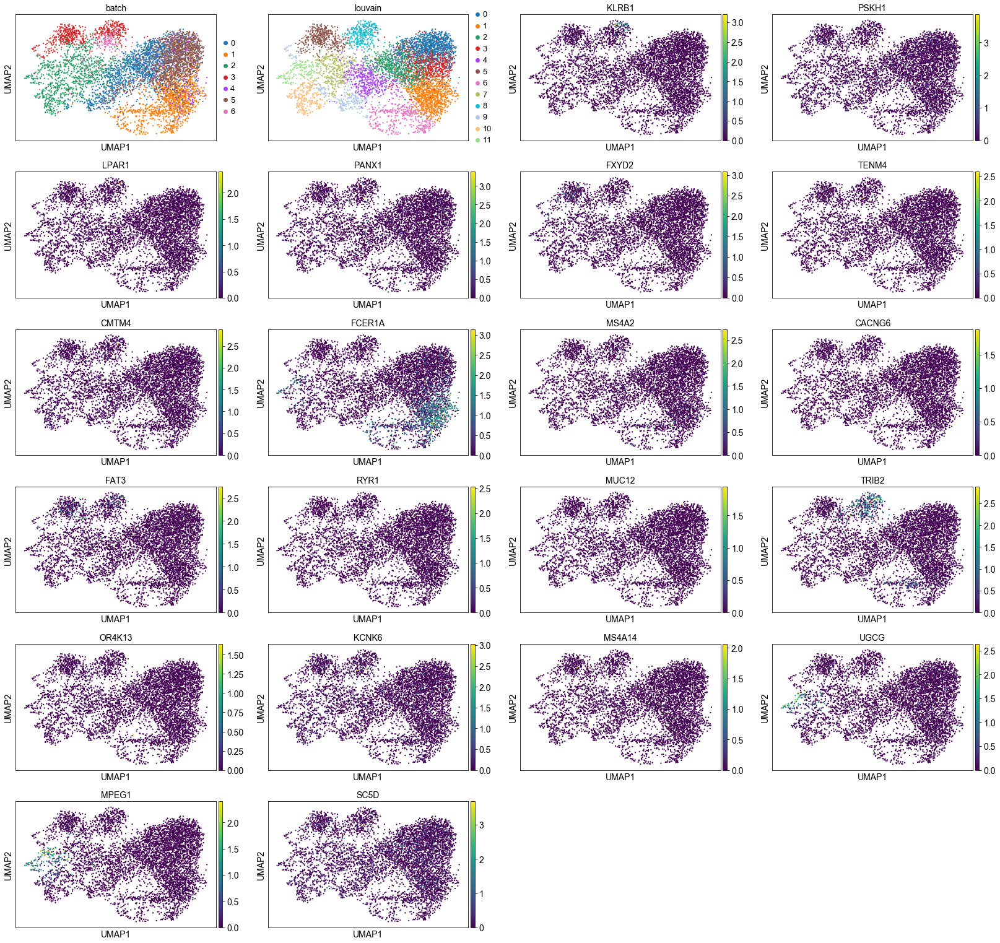

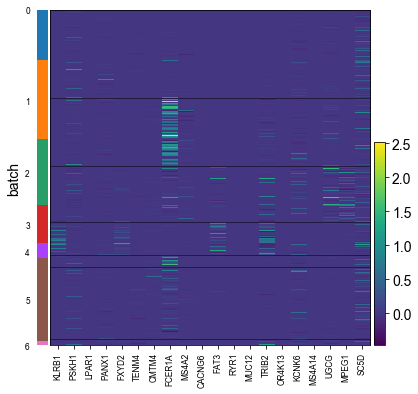

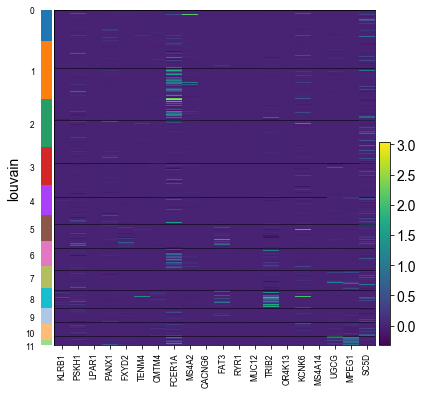

In [10]:
vis_subset(concat_one, top)

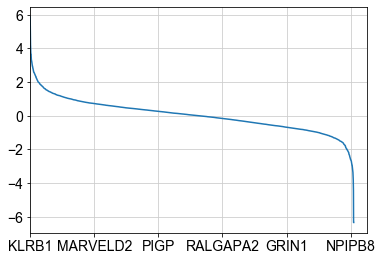

In [11]:
# determine cutoff of highly different secreted protein as clustering basis
merged['dispersions_norm'].plot()
# about z score 1.5

computing PCA with n_comps = 50
    finished (0:00:00.06)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished (0:00:03.03) --> added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix
computing UMAP
    using 'X_pca' with n_pcs = 50
    finished (0:00:16.87) --> added
    'X_umap', UMAP coordinates (adata.obsm)


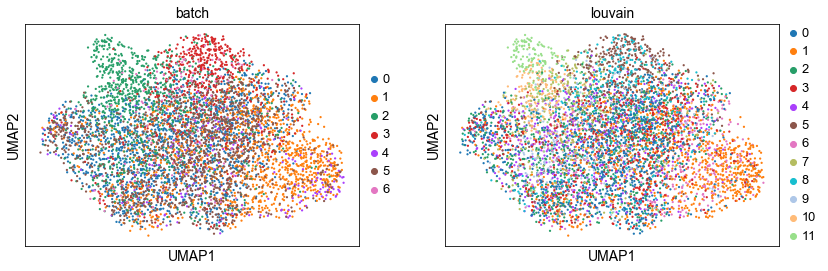

drawing single-cell graph using layout "fa"
    finished (0:00:35.28) --> added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm)


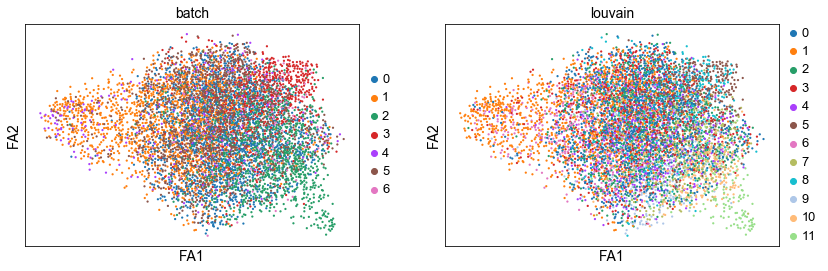

running PAGA
    finished (0:00:00.28) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
--> added 'pos', the PAGA positions (adata.uns['paga'])


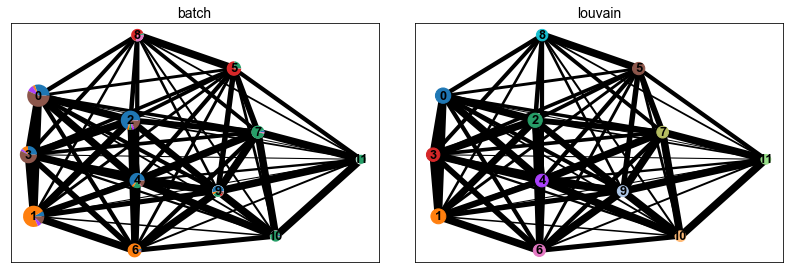

AnnData object with n_obs × n_vars = 6011 × 270 
    obs: 'batch', 'louvain'
    uns: 'pca', 'neighbors', 'batch_colors', 'louvain_colors', 'draw_graph', 'paga', 'louvain_sizes'
    obsm: 'X_pca', 'X_umap', 'X_draw_graph_fa'
    varm: 'PCs'

In [12]:
recluster(concat_one, merged, 1.5)

## Second set
1. single cell = CD34
2. membrane protein

DEFA4                               Defensin alpha 4
ELANE                 Elastase, neutrophil expressed
LYZ                                         Lysozyme
PF4                                Platelet factor 4
AZU1                                    Azurocidin 1
PRTN3                                   Proteinase 3
PRSS2                              Serine protease 2
CCL2                    C-C motif chemokine ligand 2
CCL4                    C-C motif chemokine ligand 4
RNASE2                Ribonuclease A family member 2
JCHAIN       Joining chain of multimeric IgA and IgM
SMOC1        SPARC related modular calcium binding 1
C22orf46         Chromosome 22 open reading frame 46
NPTX2                           Neuronal pentraxin 2
INSL3                                 Insulin like 3
IGLL1       Immunoglobulin lambda like polypeptide 1
CXCL8                 C-X-C motif chemokine ligand 8
CST7                                      Cystatin F
LGALS1                                    Gale

/home/hsher/miniconda3/lib/python3.7/site-packages/anndata/core/anndata.py:299: FutureWarning: In anndata v0.7+, arrays contained within an AnnData object will maintain their dimensionality. For example, prior to v0.7 `adata[0, 0].X` returned a scalar and `adata[0, :]` returned a 1d array, post v0.7 they will return two dimensional arrays. If you would like to get a one dimensional array from your AnnData object, consider using the `adata.obs_vector`, `adata.var_vector` methods or accessing the array directly.
  warn_flatten()


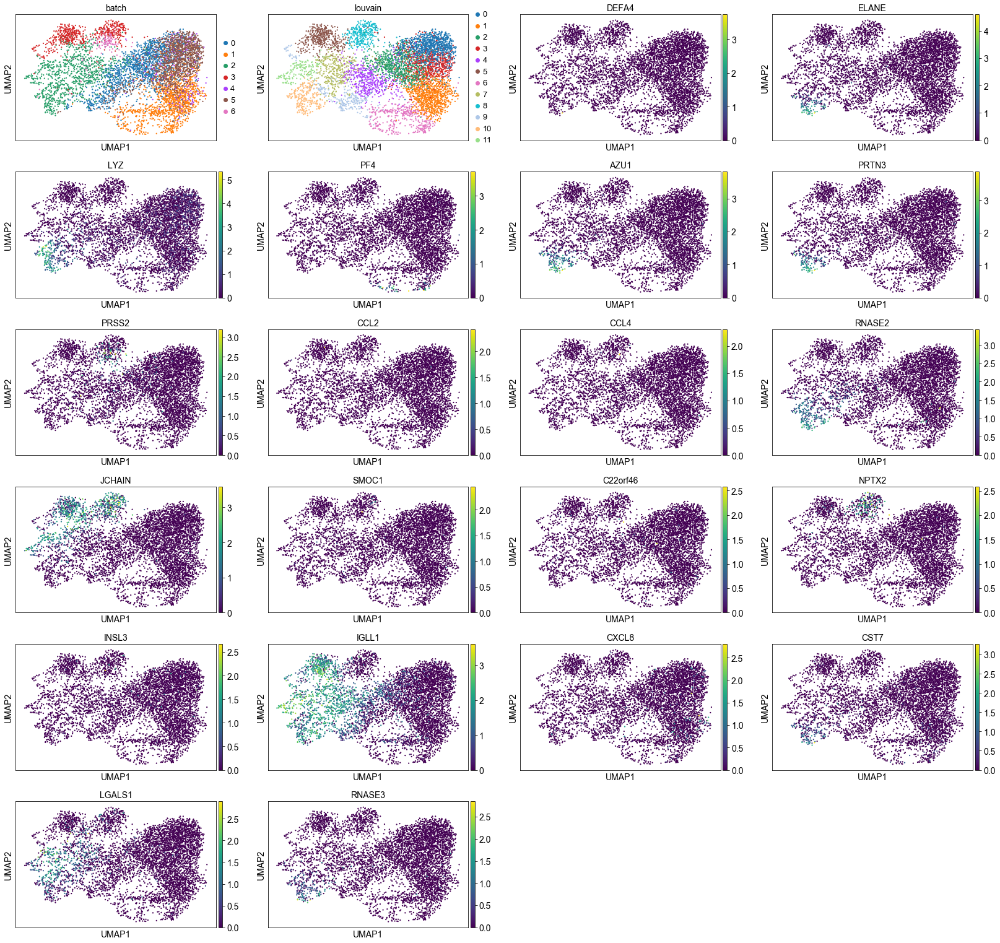

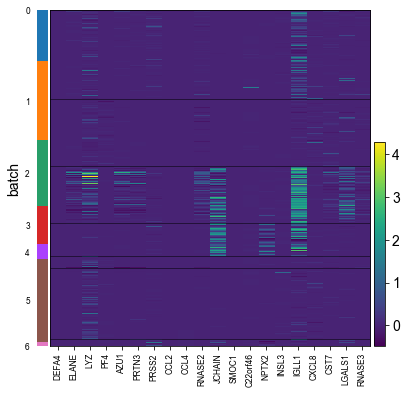

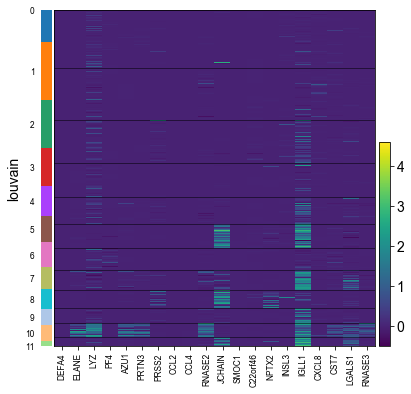

In [13]:
top, merged = merge_subset(concat_one, membrane_protein)
vis_subset(concat_one, top)

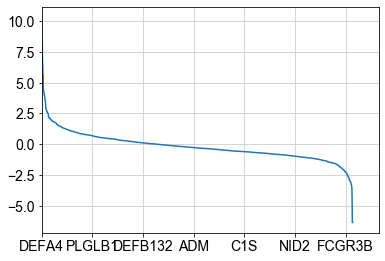

In [14]:
# determine cutoff of highly different secreted protein as clustering basis
merged['dispersions_norm'].plot()
# about z score 1.5

computing PCA with n_comps = 50
    finished (0:00:00.01)
computing neighbors
    using data matrix X directly
    finished (0:00:00.96) --> added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix
computing UMAP
    using data matrix X directly
    finished (0:00:13.20) --> added
    'X_umap', UMAP coordinates (adata.obsm)


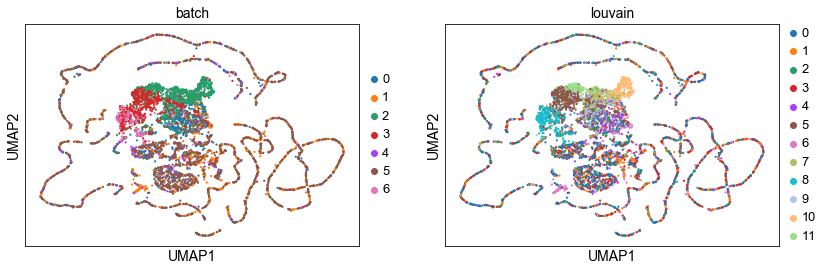

drawing single-cell graph using layout "fa"
    finished (0:00:35.75) --> added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm)


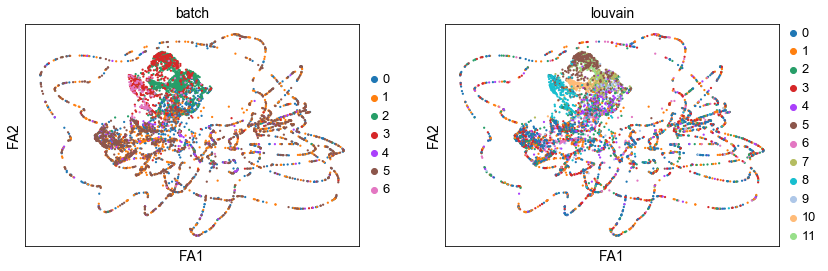

running PAGA
    finished (0:00:00.28) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
--> added 'pos', the PAGA positions (adata.uns['paga'])


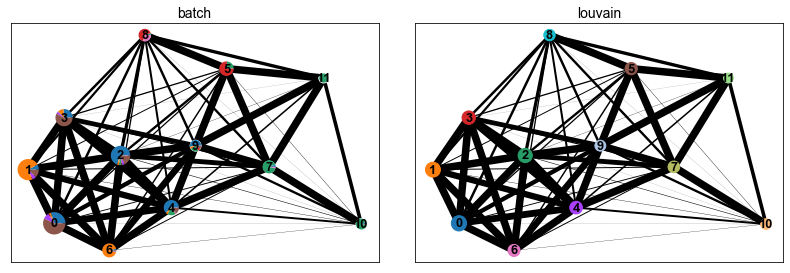

AnnData object with n_obs × n_vars = 6011 × 45 
    obs: 'batch', 'louvain'
    uns: 'pca', 'neighbors', 'batch_colors', 'louvain_colors', 'draw_graph', 'paga', 'louvain_sizes'
    obsm: 'X_pca', 'X_umap', 'X_draw_graph_fa'
    varm: 'PCs'

In [15]:
recluster(concat_one, merged, 2)

## Third set
1. single cell = Lin cells
2. secreted_protein

MS4A2                         Membrane spanning 4-domains A2
TMCC2          Transmembrane and coiled-coil domain family 2
FCER1A                        Fc fragment of IgE receptor Ia
ALOX5AP       Arachidonate 5-lipoxygenase activating protein
XPO7                                              Exportin 7
CXCR4                       C-X-C motif chemokine receptor 4
S100A10                     S100 calcium binding protein A10
CEACAM6    Carcinoembryonic antigen related cell adhesion...
XCR1                          X-C motif chemokine receptor 1
SLC45A3                    Solute carrier family 45 member 3
CLEC10A                  C-type lectin domain containing 10A
CD79A                                         CD79a molecule
CXCR5                       C-X-C motif chemokine receptor 5
GPR68                          G protein-coupled receptor 68
CD9                                             CD9 molecule
CSF2RB     Colony stimulating factor 2 receptor beta comm...
SLC2A1                  

/home/hsher/miniconda3/lib/python3.7/site-packages/anndata/core/anndata.py:299: FutureWarning: In anndata v0.7+, arrays contained within an AnnData object will maintain their dimensionality. For example, prior to v0.7 `adata[0, 0].X` returned a scalar and `adata[0, :]` returned a 1d array, post v0.7 they will return two dimensional arrays. If you would like to get a one dimensional array from your AnnData object, consider using the `adata.obs_vector`, `adata.var_vector` methods or accessing the array directly.
  warn_flatten()


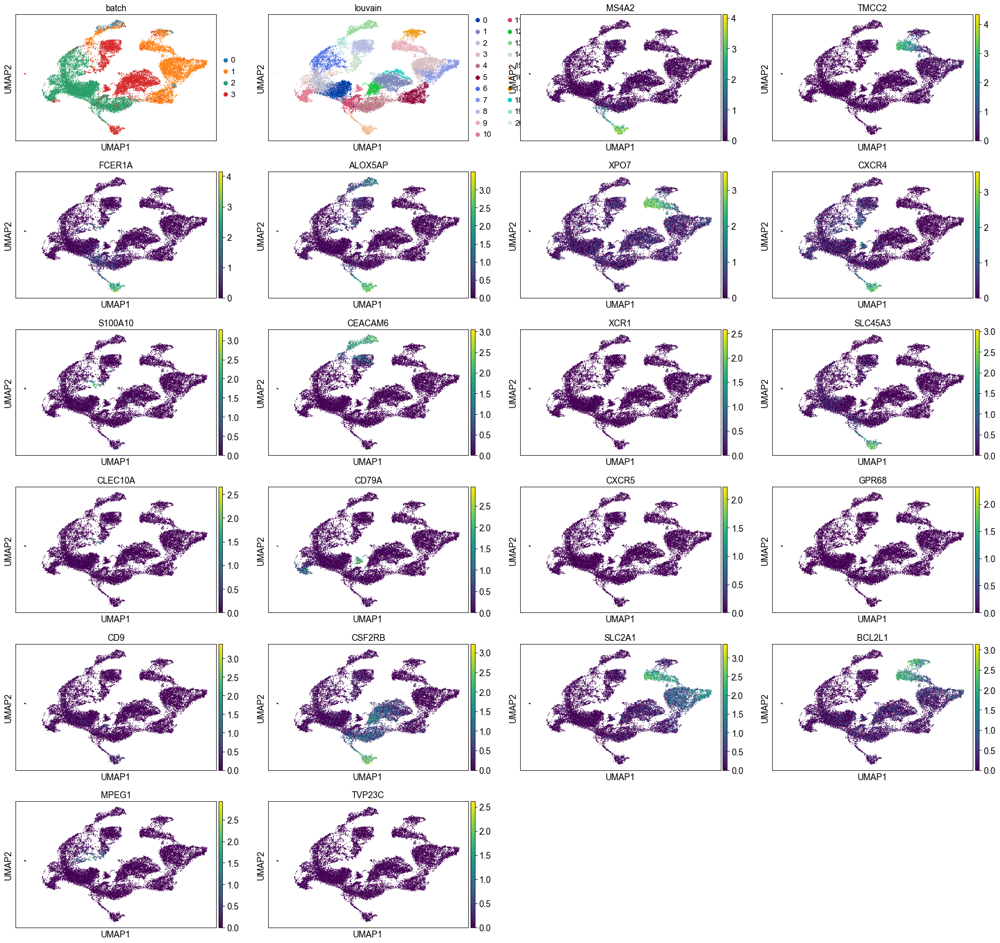

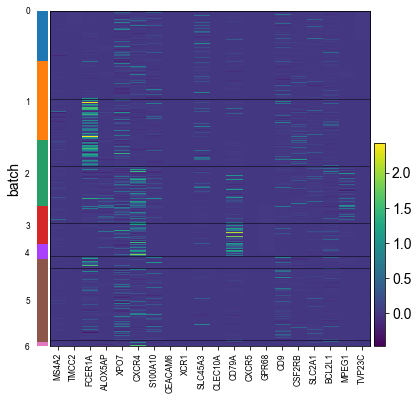

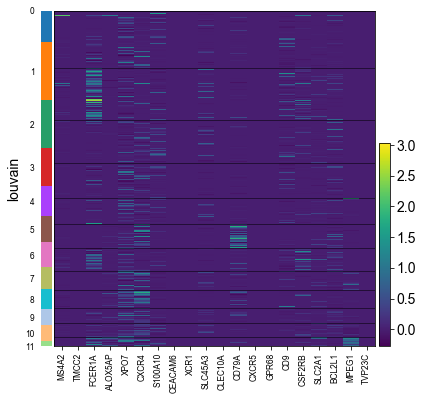

In [16]:
top, merged = merge_subset(concat_two, secreted_protein)
vis_subset(concat_two, top)

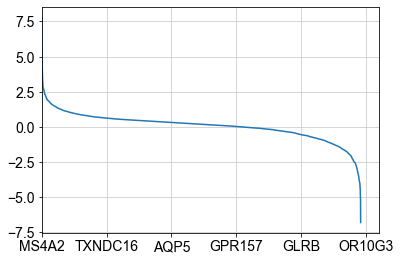

In [17]:
# determine cutoff of highly different secreted protein as clustering basis
merged['dispersions_norm'].plot()
# about z score 1.5

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


computing PCA with n_comps = 50
    finished (0:00:00.05)
computing neighbors
    using 'X_pca' with n_pcs = 50


/home/hsher/miniconda3/lib/python3.7/site-packages/numba/compiler.py:602: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../miniconda3/lib/python3.7/site-packages/umap/rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^

  self.func_ir.loc))
/home/hsher/miniconda3/lib/python3.7/site-packages/umap/nndescent.py:92: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../miniconda3/lib/python3.7/site-packages/umap/utils.py", line 409:
@num

    finished (0:00:08.03) --> added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix
computing UMAP
    using 'X_pca' with n_pcs = 50
    finished (0:00:15.75) --> added
    'X_umap', UMAP coordinates (adata.obsm)


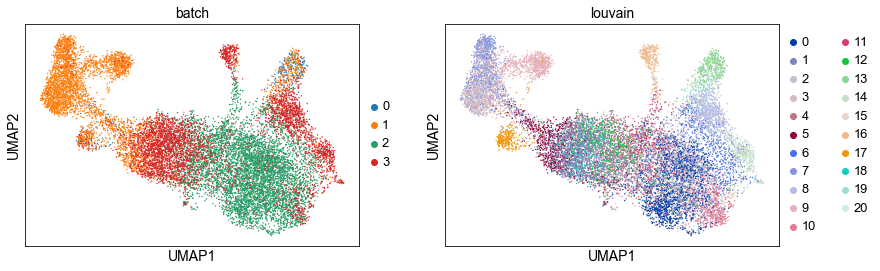

drawing single-cell graph using layout "fa"
    finished (0:01:55.76) --> added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm)


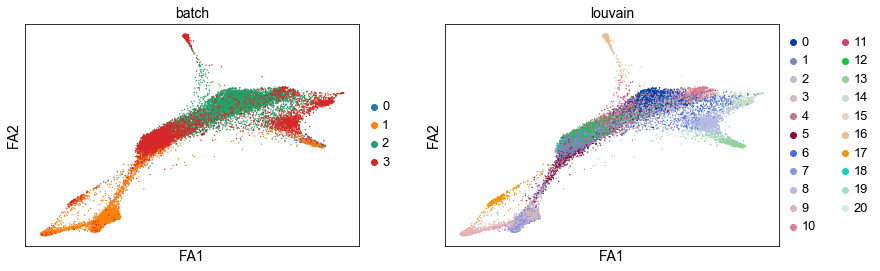

running PAGA
    finished (0:00:01.10) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
--> added 'pos', the PAGA positions (adata.uns['paga'])


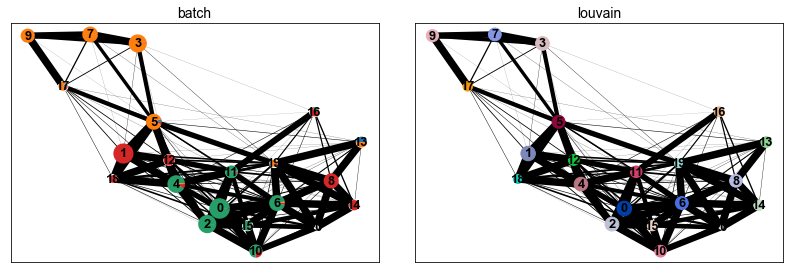

AnnData object with n_obs × n_vars = 15386 × 187 
    obs: 'batch', 'louvain'
    uns: 'pca', 'neighbors', 'batch_colors', 'louvain_colors', 'draw_graph', 'paga', 'louvain_sizes'
    obsm: 'X_pca', 'X_umap', 'X_draw_graph_fa'
    varm: 'PCs'

In [18]:
recluster(concat_two, merged, 1.5)

## Fourth set
1. single cell = Lin cells
2. membrane_protein

TCN1                                  Transcobalamin 1
TPSAB1                           Tryptase alpha/beta 1
CPA3                               Carboxypeptidase A3
S100A8                 S100 calcium binding protein A8
CXCL8                   C-X-C motif chemokine ligand 8
PF4                                  Platelet factor 4
OLFM4                                   Olfactomedin 4
DEFB1                                  Defensin beta 1
PPBP                        Pro-platelet basic protein
LTF                                   Lactotransferrin
BPI       Bactericidal/permeability-increasing protein
DEFA4                                 Defensin alpha 4
S100A9                 S100 calcium binding protein A9
RNASE3                  Ribonuclease A family member 3
JCHAIN         Joining chain of multimeric IgA and IgM
CST3                                        Cystatin C
LUM                                            Lumican
ANXA2                                       Annexin A2
LGALS1    

/home/hsher/miniconda3/lib/python3.7/site-packages/anndata/core/anndata.py:299: FutureWarning: In anndata v0.7+, arrays contained within an AnnData object will maintain their dimensionality. For example, prior to v0.7 `adata[0, 0].X` returned a scalar and `adata[0, :]` returned a 1d array, post v0.7 they will return two dimensional arrays. If you would like to get a one dimensional array from your AnnData object, consider using the `adata.obs_vector`, `adata.var_vector` methods or accessing the array directly.
  warn_flatten()


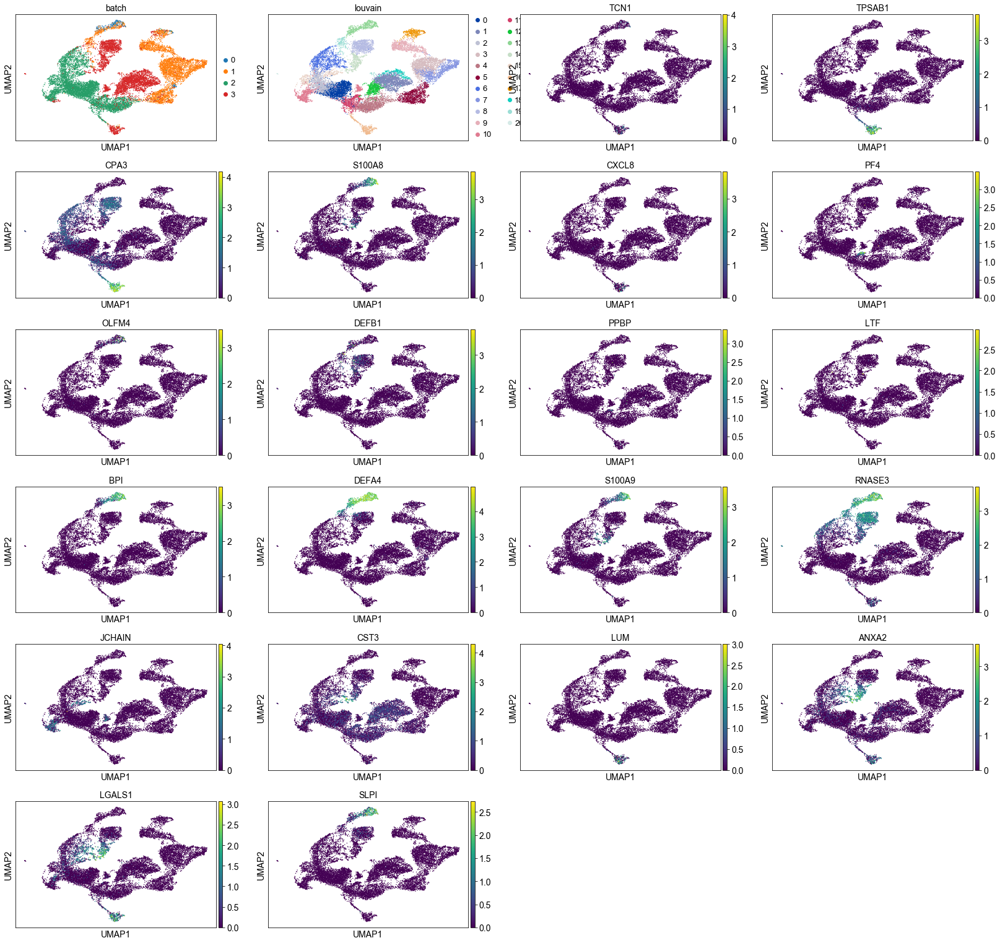

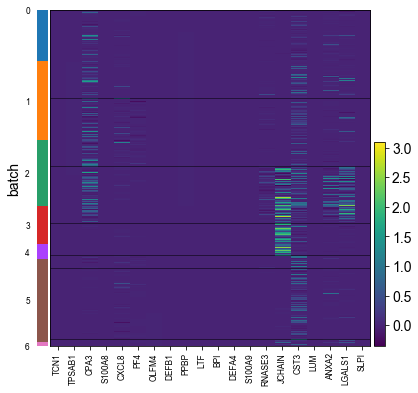

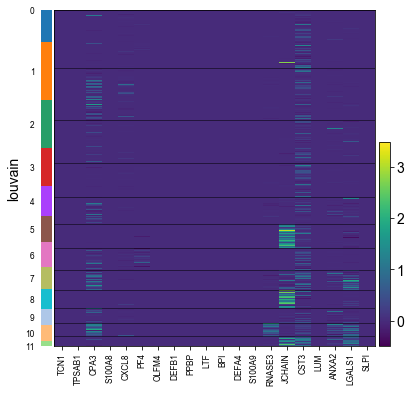

In [19]:
top, merged = merge_subset(concat_two, membrane_protein)
vis_subset(concat_two, top)

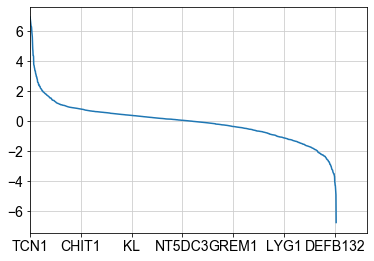

In [20]:
# determine cutoff of highly different secreted protein as clustering basis
merged['dispersions_norm'].plot()
# about z score 1.5

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


computing PCA with n_comps = 50
    finished (0:00:00.04)
computing neighbors
    using 'X_pca' with n_pcs = 50


/home/hsher/miniconda3/lib/python3.7/site-packages/numba/compiler.py:602: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../miniconda3/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  self.func_ir.loc))


    finished (0:00:04.05) --> added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix
computing UMAP
    using 'X_pca' with n_pcs = 50
    finished (0:00:16.80) --> added
    'X_umap', UMAP coordinates (adata.obsm)


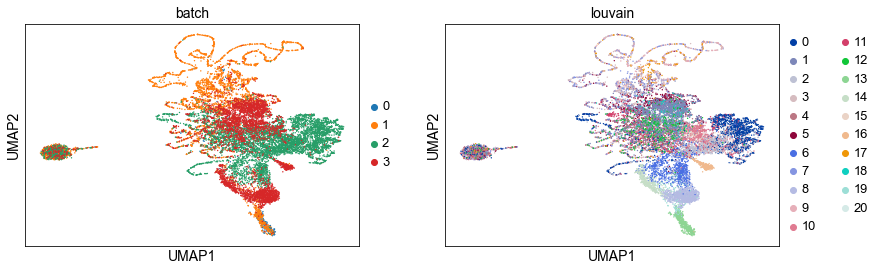

drawing single-cell graph using layout "fa"
    finished (0:01:53.05) --> added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm)


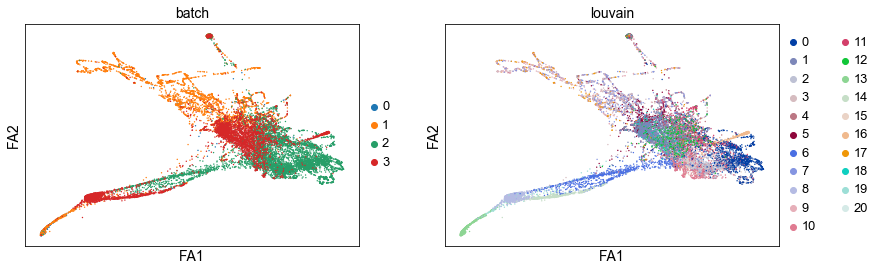

running PAGA
    finished (0:00:01.07) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
--> added 'pos', the PAGA positions (adata.uns['paga'])


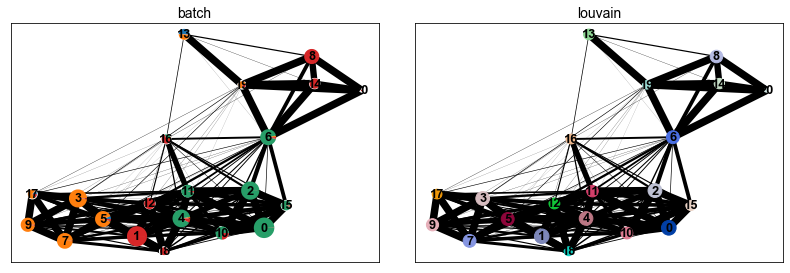

AnnData object with n_obs × n_vars = 15386 × 103 
    obs: 'batch', 'louvain'
    uns: 'pca', 'neighbors', 'batch_colors', 'louvain_colors', 'draw_graph', 'paga', 'louvain_sizes'
    obsm: 'X_pca', 'X_umap', 'X_draw_graph_fa'
    varm: 'PCs'

In [21]:
recluster(concat_two, merged, 1.5)